# ***PROGETTO WILDCAT***

---



# Imports

In [1]:
## Standard libraries
import os
import numpy as np
import random
from PIL import Image
from types import SimpleNamespace
from matplotlib_inline.backend_inline import set_matplotlib_formats

## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline
set_matplotlib_formats('svg', 'pdf') # For export
import matplotlib
matplotlib.rcParams['lines.linewidth'] = 2.0
import seaborn as sns
sns.reset_orig()

## PyTorch
import torch
import torch.nn as nn
import torch.utils.data as data
import torch.optim as optim
# Torchvision
import torchvision
from torchvision.datasets import CIFAR10
from torchvision import transforms

from typing import Callable, Optional, Union

## Progress bar
from tqdm.notebook import tqdm

from typing import Sequence


# Modello Wildcat

## Pooling layer

In [2]:

import torch
import torch.nn as nn
from torch.autograd import Function
import sys

class WildcatPool2dFunction(Function):
    @staticmethod
    def forward(ctx, input, kmax, kmin, alpha):
        ctx.kmax = kmax
        ctx.kmin = kmin
        ctx.alpha = alpha

        def get_positive_k(k, n):
              if k <= 0:
                return 0
              elif k < 1:
                return round(k * n)
              elif k > n:
                return int(n)
              else:
                return int(k)

        batch_size = input.size(0)
        num_channels = input.size(1)
        h = input.size(2)
        w = input.size(3)

        n = h * w  # number of regions

        kmax = get_positive_k(kmax, n)
        kmin = get_positive_k(kmin, n)

        sorted, indices = input.new(), input.new().long()
        torch.sort(input.view(batch_size, num_channels, n), dim=2, descending=True, out=(sorted, indices))

        ctx.indices_max = indices.narrow(2, 0, kmax)
        output = sorted.narrow(2, 0, kmax).sum(2).div_(kmax)

        if kmin > 0 and (alpha != 0):
              ctx.indices_min = indices.narrow(2, n - kmin, kmin)
              output.add_(sorted.narrow(2, n - kmin, kmin).sum(2).mul_(alpha / kmin)).div_(2)

        ctx.save_for_backward(input)

        return output.view(batch_size, num_channels)

    @staticmethod
    def backward(ctx, grad_output):
        input, = ctx.saved_tensors
        def get_positive_k(k, n):
              if k <= 0:
                return 0
              elif k < 1:
                return round(k * n)
              elif k > n:
                return int(n)
              else:
                return int(k)

        batch_size = input.size(0)
        num_channels = input.size(1)
        h = input.size(2)
        w = input.size(3)

        n = h * w  # number of regions

        kmax = get_positive_k(ctx.kmax, n)
        kmin = get_positive_k(ctx.kmin, n)

        grad_output_max = grad_output.view(batch_size, num_channels, 1).expand(batch_size, num_channels, kmax)

        grad_input = grad_output.new().resize_(batch_size, num_channels, n).fill_(0).scatter_(2, ctx.indices_max,
                                                                                              grad_output_max).div_(kmax)

        if kmin > 0 and (ctx.alpha != 0):
            grad_output_min = grad_output.view(batch_size, num_channels, 1).expand(batch_size, num_channels, kmin)
            grad_input_min = grad_output.new().resize_(batch_size, num_channels, n).fill_(0).scatter_(2,
                                                                                                      ctx.indices_min,
                                                                                                      grad_output_min).mul_(
                ctx.alpha / kmin)
            grad_input.add_(grad_input_min).div_(2)

        return grad_input.view(batch_size, num_channels, h, w), None, None, None

class WildcatPool2d(nn.Module):
    def __init__(self, kmax=1, kmin=None, alpha=1):
        super(WildcatPool2d, self).__init__()
        self.kmax = kmax
        self.kmin = kmin if kmin is not None else kmax
        self.alpha = alpha

    def forward(self, input):
        return WildcatPool2dFunction.apply(input, self.kmax, self.kmin, self.alpha)

    def __repr__(self):
        return self.__class__.__name__ + ' (kmax=' + str(self.kmax) + ', kmin=' + str(self.kmin) + ', alpha=' + str(
            self.alpha) + ')'

class ClassWisePoolFunction(Function):
    @staticmethod
    def forward(ctx, input, num_maps):
        ctx.num_maps = num_maps

        batch_size, num_channels, h, w = input.size()

        if num_channels % num_maps != 0:
            print('Error in ClassWisePoolFunction. The number of channels has to be a multiple of the number of maps per class')
            sys.exit(-1)

        num_outputs = int(num_channels / ctx.num_maps)
        x = input.view(batch_size, num_outputs, ctx.num_maps, h, w)
        output = torch.sum(x, 2)
        ctx.save_for_backward(input)
        return output.view(batch_size, num_outputs, h, w) / ctx.num_maps

    @staticmethod
    def backward(ctx, grad_output):
        input, = ctx.saved_tensors

        batch_size, num_channels, h, w = input.size()
        num_outputs = grad_output.size(1)

        grad_input = grad_output.view(batch_size, num_outputs, 1, h, w).expand(batch_size, num_outputs, ctx.num_maps,
                                                                               h, w).contiguous()

        return grad_input.view(batch_size, num_channels, h, w), None

class ClassWisePool(nn.Module):
    def __init__(self, num_maps):
        super(ClassWisePool, self).__init__()
        self.num_maps = num_maps

    def forward(self, input):
        return ClassWisePoolFunction.apply(input, self.num_maps)

    def __repr__(self):
        return self.__class__.__name__ + ' (num_maps={num_maps})'.format(num_maps=self.num_maps)


## Backbone e Transfer layer

In [3]:

import torchvision.models as models

class ResNetWSL(nn.Module):

    def __init__(self, model, num_classes, pooling=WildcatPool2d(), dense=False):
        super(ResNetWSL, self).__init__()

        self.dense = dense
        self.features = nn.Sequential(
            model.conv1,
            model.bn1,
            model.relu,
            model.maxpool,
            model.layer1,
            model.layer2,
            model.layer3,
            model.layer4)

        num_features = model.layer4[1].conv1.in_channels #prende inl mum di input features del secondo blocco di layer 4, per essere l'output di classification
        self.classifier = nn.Sequential(
            nn.Conv2d(num_features, num_classes, kernel_size=1, stride=1, padding=0, bias=True))

        self.spatial_pooling = pooling

        #self.image_normalization_mean = [0.485, 0.456, 0.406]
        #self.image_normalization_std = [0.229, 0.224, 0.225]
        #self.image_normalization_mean =[0.4219, 0.3831, 0.2907 ]
        #self.image_normalization_std = [0.1242, 0.1329, 0.1339]

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        if not self.dense:
            x = self.spatial_pooling(x)
        return x

    def get_config_optim(self, lr, lrp):
        return [{'params': self.features.parameters(), 'lr': lr * lrp},
                {'params': self.classifier.parameters()},
                {'params': self.spatial_pooling.parameters()}]

def resnet101_wildcat(num_classes, pretrained=True, kmax=1, kmin=None, alpha=1, num_maps=1):
    model = models.resnet101(pretrained)
    pooling = nn.Sequential()
    pooling.add_module('class_wise', ClassWisePool(num_maps))
    pooling.add_module('spatial', WildcatPool2d(kmax, kmin, alpha))
    return ResNetWSL(model, num_classes * num_maps, pooling=pooling)

## Logistic Regression baseline

In [4]:

class LogisticRegressionModel(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(LogisticRegressionModel, self).__init__()
        self.linear = nn.Linear(input_dim, output_dim)

    def forward(self, x):
        out = torch.sigmoid(self.linear(x))
        return out

# DATSAET CLASS

In [5]:
class CanopiesDataset(torch.utils.data.Dataset):
  def __init__(self, root_dir, transform=None, classe = "tutte", scale = "tutte"):
    self.root_dir = root_dir
    self.class_names = sorted(os.listdir(root_dir), reverse=True)
    self.transform = transform
    self.image_paths=[]

    for class_name in self.class_names:
      class_dir = os.path.join(root_dir, class_name)
      scale_dirs = os.listdir(class_dir)
      for scale_dir in scale_dirs:
        scale_path = os.path.join(class_dir, scale_dir)
        image_names= os.listdir(scale_path)
        for image_name in image_names:
          if image_name.endswith(".jpg"):
              if ( classe == "tutte" or classe == class_name):
                    if (scale == "tutte" or scale == scale_dir):
                        image_path = os.path.join(scale_path, image_name)
                        self.image_paths.append((image_path, self.class_names.index(class_name)))

  def __len__(self):
        return len(self.image_paths)

  def __getitem__(self, idx):
        image_path, label = self.image_paths[idx]
        image = np.array(Image.open(image_path).convert("RGB"))

        if self.transform:
            image = self.transform(image)

        return image, label


# Dataset analysis

In [6]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

set_seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

IMAGE_HEIGHT = IMAGE_WIDTH = 448
ROOT_DIR = os.path.join("drive", "MyDrive", "first_dataset")
class_names = sorted(os.listdir(ROOT_DIR), reverse = True)

transform = torchvision.transforms.Compose(
    [
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Resize((IMAGE_HEIGHT, IMAGE_WIDTH), antialias=True),
        torchvision.transforms.Normalize(
        mean=[0.4219, 0.3831, 0.2907 ],
        std=[0.1242, 0.1329, 0.1339],
        )
    ]
)


dataset = CanopiesDataset(ROOT_DIR, transform = transform, classe = "tutte")

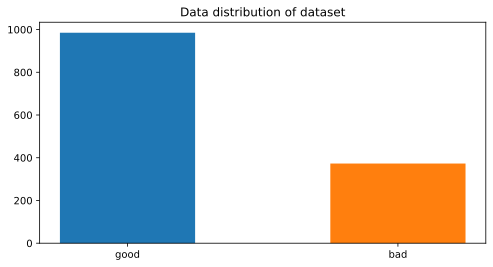

[985 373]


In [8]:
def distribution(dataset, titolo):
    labels = np.array(list(zip(*dataset))[1])
    count_0 = np.sum(labels == 0)
    count_1 = len(labels) - count_0
    labels_count = np.array([count_0, count_1])
    class_names = ["good", "bad"]

    plt.figure(figsize=(8, 4))
    plt.title('Data distribution of '+ titolo)
    plt.bar(class_names, labels_count, width=.5, color = ['C0', 'C1'])
    plt.show()
    print(labels_count)


distribution(dataset, "dataset")

## training, validation and test datasets




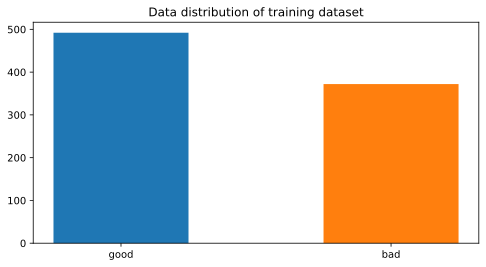

[492 372]


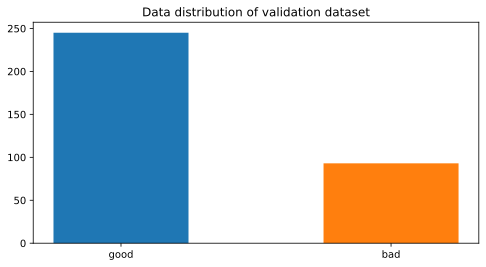

[245  93]


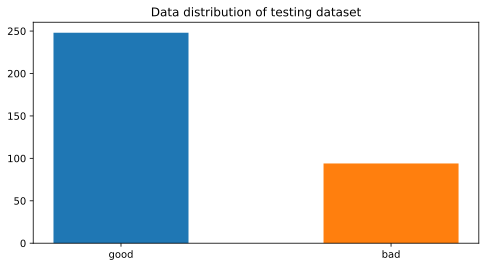

[248  94]


In [9]:

transform_bad = torchvision.transforms.Compose(
    [
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Resize((IMAGE_HEIGHT, IMAGE_WIDTH), antialias=True),
        torchvision.transforms.Normalize(
        mean=[0.4219, 0.3831, 0.2907 ],
        std=[0.1242, 0.1329, 0.1339],
        ),
        torchvision.transforms.RandomHorizontalFlip(0.5),
        torchvision.transforms.RandomRotation(degrees=(60, 90)),

    ]
)

dataset_good_1 = CanopiesDataset(ROOT_DIR, transform = transform, classe="good", scale = "scale_1" )
dataset_good_15 = CanopiesDataset(ROOT_DIR, transform = transform, classe="good", scale = "scale_1.5" )
dataset_good_2 = CanopiesDataset(ROOT_DIR, transform = transform, classe="good", scale = "scale_2" )

dataset_bad_1 = CanopiesDataset(ROOT_DIR, transform = transform, classe = "bad", scale = "scale_1")
dataset_bad_15 = CanopiesDataset(ROOT_DIR, transform = transform, classe = "bad", scale = "scale_1.5")
dataset_bad_2= CanopiesDataset(ROOT_DIR, transform = transform, classe = "bad", scale = "scale_2")

dataset_bad_aug_1 = CanopiesDataset(ROOT_DIR, transform = transform_bad, classe = "bad", scale =  "scale_1")
dataset_bad_aug_15 = CanopiesDataset(ROOT_DIR, transform = transform_bad, classe = "bad", scale = "scale_1.5")
dataset_bad_aug_2 = CanopiesDataset(ROOT_DIR, transform = transform_bad, classe = "bad", scale = "scale_2")


x_good_1 = int(0.5 * len(dataset_good_1))
y_good_1 = int (1.5 * x_good_1)
x_good_15 = int(0.5 * len(dataset_good_15))
y_good_15 = int(1.5 * x_good_15)
x_good_2 = int(0.5 * len(dataset_good_2))
y_good_2 = int (1.5 * x_good_2)

x_bad_1 = int(0.5 * len(dataset_bad_1))
y_bad_1 = int (1.5 * x_bad_1)
x_bad_15 = int(0.5 * len(dataset_bad_15))
y_bad_15 = int(1.5 * x_bad_15)
x_bad_2 = int(0.5 * len(dataset_bad_2))
y_bad_2 = int(1.5 * x_bad_2)

#a per train, b per val, c per test
a_good_1 = torch.utils.data.Subset( dataset_good_1, range(x_good_1) )
b_good_1 = torch.utils.data.Subset( dataset_good_1, range(x_good_1, y_good_1) )
c_good_1 = torch.utils.data.Subset( dataset_good_1, range(y_good_1, len(dataset_good_1)) )

a_good_15 = torch.utils.data.Subset( dataset_good_15, range(x_good_15) )
b_good_15 = torch.utils.data.Subset( dataset_good_15, range(x_good_15, y_good_15) )
c_good_15 = torch.utils.data.Subset( dataset_good_15, range(y_good_15, len(dataset_good_15)) )

a_good_2 = torch.utils.data.Subset( dataset_good_2, range(x_good_2) )
b_good_2 = torch.utils.data.Subset( dataset_good_2, range(x_good_2, y_good_2) )
c_good_2 = torch.utils.data.Subset( dataset_good_2, range(y_good_2, len(dataset_good_2)) )

a_bad_1 = torch.utils.data.Subset( dataset_bad_1, range(x_bad_1) )
b_bad_1 = torch.utils.data.Subset( dataset_bad_1, range(x_bad_1, y_bad_1) )
c_bad_1 = torch.utils.data.Subset( dataset_bad_1, range(y_bad_1, len(dataset_bad_1)) )

a_bad_15 = torch.utils.data.Subset( dataset_bad_15, range(x_bad_15) )
b_bad_15 = torch.utils.data.Subset( dataset_bad_15, range(x_bad_15, y_bad_15) )
c_bad_15 = torch.utils.data.Subset( dataset_bad_15, range(y_bad_15, len(dataset_bad_15)) )

a_bad_2 = torch.utils.data.Subset( dataset_bad_2, range(x_bad_2) )
b_bad_2 = torch.utils.data.Subset( dataset_bad_2, range(x_bad_2, y_bad_2) )
c_bad_2 = torch.utils.data.Subset( dataset_bad_2, range(y_bad_2, len(dataset_bad_2)) )

a_bad_aug_1 = torch.utils.data.Subset( dataset_bad_aug_1, range(x_bad_1) )
b_bad_aug_1 = torch.utils.data.Subset( dataset_bad_aug_1, range(x_bad_1, y_bad_2) )
c_bad_aug_1 = torch.utils.data.Subset( dataset_bad_aug_1, range(y_bad_1, len(dataset_bad_aug_1)) )

a_bad_aug_15 = torch.utils.data.Subset( dataset_bad_aug_15, range(x_bad_15) )
b_bad_aug_15 = torch.utils.data.Subset( dataset_bad_aug_15, range(x_bad_15, y_bad_15) )
c_bad_aug_15 = torch.utils.data.Subset( dataset_bad_aug_15, range(y_bad_15, len(dataset_bad_aug_15)) )

a_bad_aug_2 = torch.utils.data.Subset( dataset_bad_aug_2, range(x_bad_2) )
b_bad_aug_2 = torch.utils.data.Subset( dataset_bad_aug_2, range(x_bad_2, y_bad_2) )
c_bad_aug_2 = torch.utils.data.Subset( dataset_bad_aug_2, range(y_bad_2, len(dataset_bad_aug_2)) )


train_dataset = torch.utils.data.ConcatDataset([a_good_1, a_good_15, a_good_2,
                                                a_bad_1, a_bad_15, a_bad_2,
                                                a_bad_aug_1, a_bad_aug_15, a_bad_aug_2])

val_dataset = torch.utils.data.ConcatDataset([b_good_1, b_good_15, b_good_2,
                                              b_bad_1, b_bad_15, b_bad_2])

test_dataset = torch.utils.data.ConcatDataset([c_good_1, c_good_15, c_good_2,
                                               c_bad_1, c_bad_15, c_bad_2])

distribution(train_dataset, "training dataset")
distribution(val_dataset,"validation dataset")
distribution(test_dataset, "testing dataset")

# Funzioni train e validate

In [10]:
def train(epoch,model, optimizer, criterion, loader, device, log_interval=200, lin = False):
    model.train()

    for batch_idx, (data, target) in enumerate(loader):

        data = data.to(device)
        target = target.to(device)

        if (lin):
          data = data.view(data.shape[0], -1)

        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()

        if (batch_idx % log_interval) == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(loader.dataset),
                100. * batch_idx / len(loader), loss.data.item()))

In [11]:
def validate(model, criterion,loader, device, lin = False ):
    model.eval()
    val_loss, correct = 0, 0
    with torch.no_grad():
        for data, target in loader:
            data = data.to(device)
            target = target.to(device)
            if(lin):
                data = data.view(data.shape[0], -1)
            output = model(data)
            val_loss += criterion(output, target).data.item()
            pred = output.data.max(1)[1]
            correct += pred.eq(target.data).sum()

        val_loss /= len(loader)
        accuracy = 100. * correct.to(torch.float32) / len(loader.dataset)

    print('\nValidation set: Average loss: {:.4f}, Accuracy: {}/{} ({:.4f}%)\n'.format(
        val_loss, correct, len(loader.dataset), accuracy))
    return accuracy

# Training

## training baseline

In [12]:
criterion = nn.CrossEntropyLoss()

train_loader = data.DataLoader(train_dataset, batch_size= 16, shuffle=True, num_workers=2)

val_loader = data.DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=2)

model = LogisticRegressionModel((448*448*3), 2)
model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=0.001)

for epoch in range(1, 11):
  train(epoch, model, optimizer, criterion, train_loader, device, lin = True)

accuracy = validate (model, criterion, val_loader, device, lin = True)

model.to("cpu")
del train_loader
del model
del criterion
del optimizer

Train Epoch: 1 [0/864 (0%)]	Loss: 0.682586
Train Epoch: 2 [0/864 (0%)]	Loss: 0.663737
Train Epoch: 3 [0/864 (0%)]	Loss: 0.710655
Train Epoch: 4 [0/864 (0%)]	Loss: 0.652327
Train Epoch: 5 [0/864 (0%)]	Loss: 0.564035
Train Epoch: 6 [0/864 (0%)]	Loss: 0.511963
Train Epoch: 7 [0/864 (0%)]	Loss: 0.552925
Train Epoch: 8 [0/864 (0%)]	Loss: 0.545648
Train Epoch: 9 [0/864 (0%)]	Loss: 0.613772
Train Epoch: 10 [0/864 (0%)]	Loss: 0.518786

Validation set: Average loss: 0.6462, Accuracy: 221/338 (65.3846%)



In [13]:
model_save_dir = 'saved_models' #QUIII
if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)

num_classes = 2
KMAX = 1
ALPHA = 1
NUM_MAPS=1


## tuning hyperparameters : batch size and epochs

In [14]:
from itertools import product

param_grid = {  'batch_size': [16, 32, 64],
                'epochs': [20, 30, 40, 50] }

keys, values = zip(*param_grid.items())
params = [dict(zip(keys, v)) for v in product(*values)]

params = random.sample(params, 5)

results = []

for param in params:

    batch_size = param['batch_size']
    train_loader = data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

    model = resnet101_wildcat(num_classes, pretrained=True, kmax=KMAX, alpha=ALPHA, num_maps=NUM_MAPS)
    model.to(device)
    optimizer = torch.optim.SGD(model.parameters(), lr=0.001)
    criterion = nn.CrossEntropyLoss()

    for epoch in range(1, param['epochs'] + 1):
        train(epoch, model, optimizer, criterion, train_loader, device)

    accuracy = validate (model, criterion, val_loader, device)
    model.to("cpu")

    results.append([param, accuracy])
    model_filename = f"model_batch{batch_size}_epochs{param['epochs']}_acc{accuracy:.4f}.pth"
    model_path = os.path.join(model_save_dir, model_filename)
    torch.save(model.state_dict(), model_path)

    del train_loader
    del optimizer
    del model
    del criterion

results.sort(key=lambda x: x[1], reverse=True)
for result in results:
    print(result[0], result[1])

best_epochs = results[0][0]['epochs']
best_batch= results[0][0]['batch_size']

best_param = results[0][0]
best_accuracy = results[0][1]
best_model_filename = f"model_batch{best_param['batch_size']}_epochs{best_param['epochs']}_acc{best_accuracy:.4f}.pth"
best_model_path = os.path.join(model_save_dir, best_model_filename)
best_model = resnet101_wildcat(num_classes, pretrained=True, kmax=KMAX, alpha=ALPHA, num_maps=NUM_MAPS)
best_model.load_state_dict(torch.load(best_model_path))
best_model.to(device)



/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:00<00:00, 250MB/s]


Train Epoch: 1 [0/864 (0%)]	Loss: 0.724355
Train Epoch: 2 [0/864 (0%)]	Loss: 0.401373
Train Epoch: 3 [0/864 (0%)]	Loss: 0.363951
Train Epoch: 4 [0/864 (0%)]	Loss: 0.284582
Train Epoch: 5 [0/864 (0%)]	Loss: 0.297263
Train Epoch: 6 [0/864 (0%)]	Loss: 0.204238
Train Epoch: 7 [0/864 (0%)]	Loss: 0.229386
Train Epoch: 8 [0/864 (0%)]	Loss: 0.233040
Train Epoch: 9 [0/864 (0%)]	Loss: 0.184001
Train Epoch: 10 [0/864 (0%)]	Loss: 0.188803
Train Epoch: 11 [0/864 (0%)]	Loss: 0.147229
Train Epoch: 12 [0/864 (0%)]	Loss: 0.133138
Train Epoch: 13 [0/864 (0%)]	Loss: 0.116057
Train Epoch: 14 [0/864 (0%)]	Loss: 0.105236
Train Epoch: 15 [0/864 (0%)]	Loss: 0.130480
Train Epoch: 16 [0/864 (0%)]	Loss: 0.086906
Train Epoch: 17 [0/864 (0%)]	Loss: 0.081467
Train Epoch: 18 [0/864 (0%)]	Loss: 0.066471
Train Epoch: 19 [0/864 (0%)]	Loss: 0.055625
Train Epoch: 20 [0/864 (0%)]	Loss: 0.097962
Train Epoch: 21 [0/864 (0%)]	Loss: 0.070321
Train Epoch: 22 [0/864 (0%)]	Loss: 0.076809
Train Epoch: 23 [0/864 (0%)]	Loss: 0.0416

ResNetWSL(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(6

##### function to plot accuracies

In [15]:
def plot_results(data):
    parameters = [point[0] for point in data]
    accuracies = [point[1].cpu() for point in data]
    plt.plot(parameters, accuracies, marker='o', linestyle='-', color='blue')
    plt.xlabel('Parameter')
    plt.ylabel('Accuracy')
    plt.title('Parameter vs Accuracy')
    plt.ylim(30, 100)
    plt.show()

## Tuning hyperparameters: alpha

In [16]:
batch_size = best_batch
train_loader = data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

Train Epoch: 1 [0/864 (0%)]	Loss: 0.715210
Train Epoch: 2 [0/864 (0%)]	Loss: 0.234749
Train Epoch: 3 [0/864 (0%)]	Loss: 0.302891
Train Epoch: 4 [0/864 (0%)]	Loss: 0.059177
Train Epoch: 5 [0/864 (0%)]	Loss: 0.065564
Train Epoch: 6 [0/864 (0%)]	Loss: 0.133567
Train Epoch: 7 [0/864 (0%)]	Loss: 0.020237
Train Epoch: 8 [0/864 (0%)]	Loss: 0.041871
Train Epoch: 9 [0/864 (0%)]	Loss: 0.015859
Train Epoch: 10 [0/864 (0%)]	Loss: 0.051285
Train Epoch: 11 [0/864 (0%)]	Loss: 0.080542
Train Epoch: 12 [0/864 (0%)]	Loss: 0.011296
Train Epoch: 13 [0/864 (0%)]	Loss: 0.018023
Train Epoch: 14 [0/864 (0%)]	Loss: 0.018933
Train Epoch: 15 [0/864 (0%)]	Loss: 0.003796
Train Epoch: 16 [0/864 (0%)]	Loss: 0.032948
Train Epoch: 17 [0/864 (0%)]	Loss: 0.011184
Train Epoch: 18 [0/864 (0%)]	Loss: 0.010829
Train Epoch: 19 [0/864 (0%)]	Loss: 0.003003
Train Epoch: 20 [0/864 (0%)]	Loss: 0.008430
Train Epoch: 21 [0/864 (0%)]	Loss: 0.002410
Train Epoch: 22 [0/864 (0%)]	Loss: 0.000703
Train Epoch: 23 [0/864 (0%)]	Loss: 0.0035

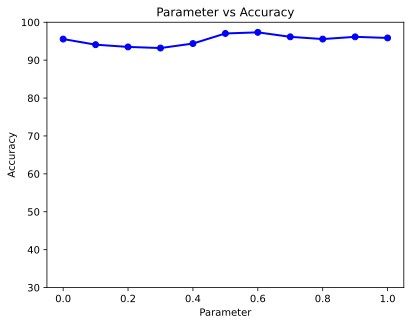

0.6


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNetWSL(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(6

In [17]:


params = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
results = []

for param in params:

    model = resnet101_wildcat(num_classes, pretrained=True, kmax = KMAX, alpha = param, num_maps = NUM_MAPS)
    model.to(device)

    optimizer = torch.optim.SGD(model.parameters(), lr=0.001)
    criterion = nn.CrossEntropyLoss()

    for epoch in range(1, best_epochs + 1):
        train(epoch, model, optimizer, criterion, train_loader, device)

    accuracy = validate (model, criterion, val_loader, device)
    model.to("cpu")

    results.append([param, accuracy])

    model_filename = f"model_alpha{param}_acc{accuracy:.4f}.pth"
    model_path = os.path.join(model_save_dir, model_filename)
    torch.save(model.state_dict(), model_path)

    del optimizer
    del model
    del criterion


for result in results:
    print(result[0], result[1])
plot_results(results)

results.sort(key=lambda x: x[1], reverse=True)
best_alpha = results[0][0]
print(best_alpha)
best_accuracy = results[0][1]
best_model_filename = f"model_alpha{best_alpha}_acc{best_accuracy:.4f}.pth"
best_model_path_alpha = os.path.join(model_save_dir, best_model_filename)
best_model_alpha = resnet101_wildcat(num_classes, pretrained=True, kmax=KMAX, alpha=best_alpha, num_maps=NUM_MAPS)
best_model_alpha.load_state_dict(torch.load(best_model_path_alpha))
best_model_alpha.to(device)


## Tuning hyperparamters: number of maps in the transfer layer for each class

Train Epoch: 1 [0/864 (0%)]	Loss: 1.001024
Train Epoch: 2 [0/864 (0%)]	Loss: 0.276785
Train Epoch: 3 [0/864 (0%)]	Loss: 0.148835
Train Epoch: 4 [0/864 (0%)]	Loss: 0.123707
Train Epoch: 5 [0/864 (0%)]	Loss: 0.214419
Train Epoch: 6 [0/864 (0%)]	Loss: 0.043238
Train Epoch: 7 [0/864 (0%)]	Loss: 0.190870
Train Epoch: 8 [0/864 (0%)]	Loss: 0.169685
Train Epoch: 9 [0/864 (0%)]	Loss: 0.018647
Train Epoch: 10 [0/864 (0%)]	Loss: 0.028419
Train Epoch: 11 [0/864 (0%)]	Loss: 0.027163
Train Epoch: 12 [0/864 (0%)]	Loss: 0.012611
Train Epoch: 13 [0/864 (0%)]	Loss: 0.080739
Train Epoch: 14 [0/864 (0%)]	Loss: 0.029329
Train Epoch: 15 [0/864 (0%)]	Loss: 0.023840
Train Epoch: 16 [0/864 (0%)]	Loss: 0.007044
Train Epoch: 17 [0/864 (0%)]	Loss: 0.069103
Train Epoch: 18 [0/864 (0%)]	Loss: 0.007433
Train Epoch: 19 [0/864 (0%)]	Loss: 0.211952
Train Epoch: 20 [0/864 (0%)]	Loss: 0.034364
Train Epoch: 21 [0/864 (0%)]	Loss: 0.021663
Train Epoch: 22 [0/864 (0%)]	Loss: 0.003007
Train Epoch: 23 [0/864 (0%)]	Loss: 0.0035

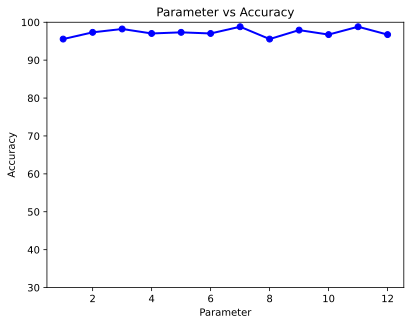

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNetWSL(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(6

In [18]:

params = [1,2,3,4,5,6,7,8,9,10,11,12]
results = []

for param in params:
    loss_vector = []
    accuracy_vector = []

    model = resnet101_wildcat(num_classes, pretrained=True, kmax = KMAX, alpha = ALPHA, num_maps = param)
    model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr=0.001)
    for epoch in range(1, best_epochs + 1):
        train(epoch, model, optimizer, criterion, train_loader, device)

    accuracy = validate (model, criterion, val_loader, device)
    model.to("cpu")

    results.append([param, accuracy])
    model_filename = f"model_num_maps{param}_acc{accuracy:.4f}.pth"
    model_path = os.path.join(model_save_dir, model_filename)
    torch.save(model.state_dict(), model_path)

    del criterion
    del optimizer
    del model

for result in results:
    print(result[0], result[1])
plot_results(results)

results.sort(key=lambda x: x[1], reverse=True)
best_num_maps = results[0][0]
best_accuracy = results[0][1]
best_model_filename = f"model_num_maps{best_num_maps}_acc{best_accuracy:.4f}.pth"
best_model_path_maps = os.path.join(model_save_dir, best_model_filename)
best_model_maps = resnet101_wildcat(num_classes, pretrained=True, kmax=KMAX, alpha=ALPHA, num_maps=best_num_maps)
best_model_maps.load_state_dict(torch.load(best_model_path_maps))
best_model_maps.to(device)

## training model with best alpha and num_maps

In [19]:
criterion = nn.CrossEntropyLoss()
model_best_alpha_and_maps = resnet101_wildcat(num_classes, pretrained=True, kmax = KMAX, alpha = best_alpha, num_maps = best_num_maps)
model_best_alpha_and_maps.to(device)

optimizer = torch.optim.SGD(model_best_alpha_and_maps.parameters(), lr=0.001)
for epoch in range(1, best_epochs + 1):
    train(epoch, model_best_alpha_and_maps, optimizer, criterion, train_loader, device)

accuracy = validate (model_best_alpha_and_maps, criterion, val_loader, device)


Train Epoch: 1 [0/864 (0%)]	Loss: 0.725974
Train Epoch: 2 [0/864 (0%)]	Loss: 0.374291
Train Epoch: 3 [0/864 (0%)]	Loss: 0.277331
Train Epoch: 4 [0/864 (0%)]	Loss: 0.048396
Train Epoch: 5 [0/864 (0%)]	Loss: 0.032675
Train Epoch: 6 [0/864 (0%)]	Loss: 0.011479
Train Epoch: 7 [0/864 (0%)]	Loss: 0.007714
Train Epoch: 8 [0/864 (0%)]	Loss: 0.035194
Train Epoch: 9 [0/864 (0%)]	Loss: 0.007721
Train Epoch: 10 [0/864 (0%)]	Loss: 0.003414
Train Epoch: 11 [0/864 (0%)]	Loss: 0.004969
Train Epoch: 12 [0/864 (0%)]	Loss: 0.001379
Train Epoch: 13 [0/864 (0%)]	Loss: 0.012596
Train Epoch: 14 [0/864 (0%)]	Loss: 0.000840
Train Epoch: 15 [0/864 (0%)]	Loss: 0.003286
Train Epoch: 16 [0/864 (0%)]	Loss: 0.002493
Train Epoch: 17 [0/864 (0%)]	Loss: 0.002145
Train Epoch: 18 [0/864 (0%)]	Loss: 0.005728
Train Epoch: 19 [0/864 (0%)]	Loss: 0.001598
Train Epoch: 20 [0/864 (0%)]	Loss: 0.005610
Train Epoch: 21 [0/864 (0%)]	Loss: 0.000235
Train Epoch: 22 [0/864 (0%)]	Loss: 0.002454
Train Epoch: 23 [0/864 (0%)]	Loss: 0.0007

# Testing

#### funzioni per visualizzare immagini

In [20]:
def denormalize(image):
    mean=np.array([0.4219, 0.3831, 0.2907 ])
    std=np.array([0.1242, 0.1329, 0.1339])
    denormalized_image = image * std + mean
    return denormalized_image

def plot_images(data: torch.Tensor, label, class_names):
  data = data.permute(0,2,3,1).detach().cpu().numpy()
  for i in range( len(data) ):
    im = denormalize(data[i])
    plt.imshow(im)
    plt.title(f"Image: {class_names[label[i]]}")
    plt.show()

def plot_images(data: torch.Tensor, label, pred, class_names):
  data = data.permute(0,2,3,1).detach().cpu().numpy()
  for i in range( len(data) ):
    im = denormalize(data[i])
    plt.imshow(im)
    plt.title(f"Image: {class_names[label[i]]}, Prediction: {class_names[pred[i]]}")
    plt.show()



## Test function

In [21]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

def plot_confusion_matrix(confusion_matrix, titolo):
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues",
                xticklabels=["Predicted Negative", "Predicted Positive"],
                yticklabels=["True Negative", "True Positive"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(titolo)
    plt.show()

def test_binary_classification(model, test_dataloader, device, metrics = False, failures = False, print_ = True, titolo = "confusion matrix"):
    model.eval()

    true_labels = []
    predicted_labels = []
    i=0
    with torch.no_grad():
        for inputs, labels in test_dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            predicted = outputs.data.max(1)[1]

            true_labels.extend(labels.cpu().numpy())
            predicted_labels.extend(predicted.cpu().numpy())
            if(metrics and print_):
                if (i % 24 == 0):
                    plot_images(inputs, labels, predicted, class_names)
            i += 1
            if(print_ and failures and predicted != labels):
                plot_images(inputs, labels, predicted, class_names)


    if(metrics ):
        confusion = confusion_matrix(true_labels, predicted_labels)
        accuracy = accuracy_score(true_labels, predicted_labels)
        precision = precision_score(true_labels, predicted_labels)
        recall = recall_score(true_labels, predicted_labels)
        f1 = f1_score(true_labels, predicted_labels)

        print(f"Test Accuracy: {100 * accuracy:.4f}%")
        print(f"Precision: {100* precision:.4f}%")
        print(f"Recall: {100 * recall:.4f}%")
        print(f"F1 Score: {f1:.4f}")
        plot_confusion_matrix(confusion, titolo)


## Results

Test Accuracy: 97.0760%
Precision: 98.8372%
Recall: 90.4255%
F1 Score: 0.9444


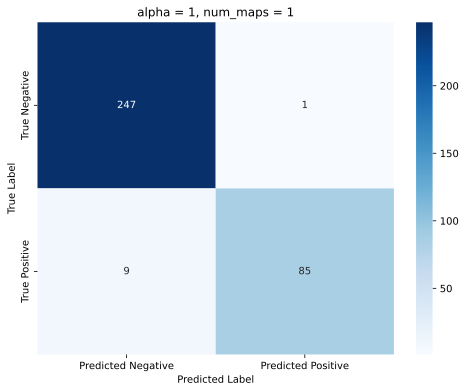

Test Accuracy: 96.4912%
Precision: 95.5556%
Recall: 91.4894%
F1 Score: 0.9348


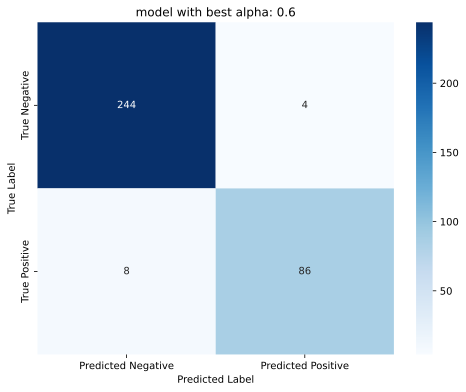

Test Accuracy: 97.9532%
Precision: 98.8764%
Recall: 93.6170%
F1 Score: 0.9617


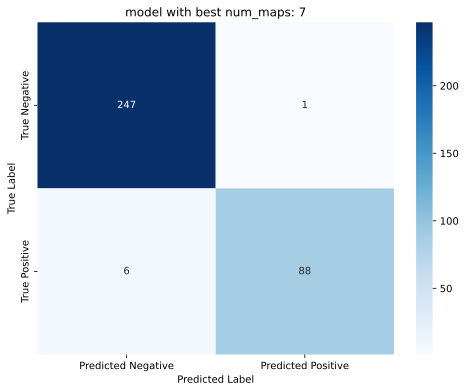

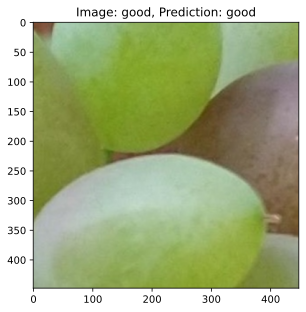

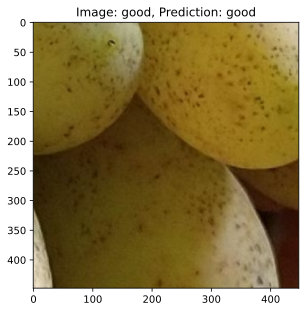

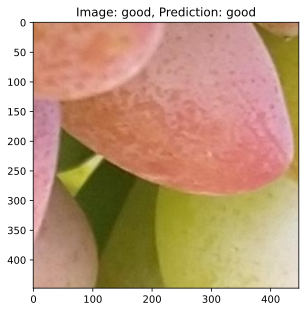

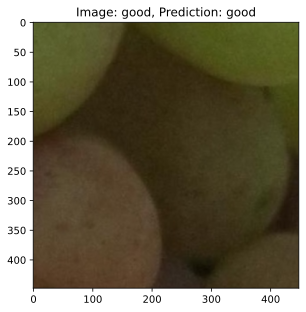

...

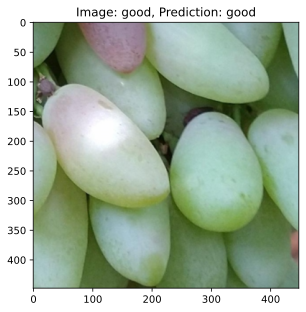

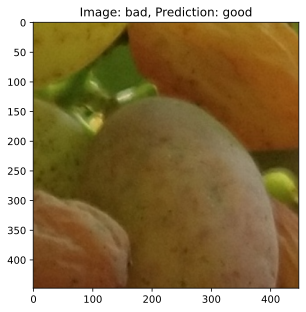

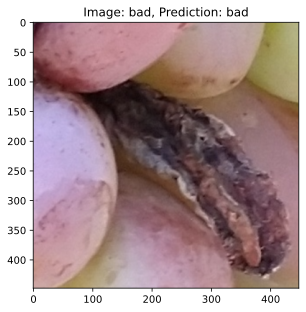

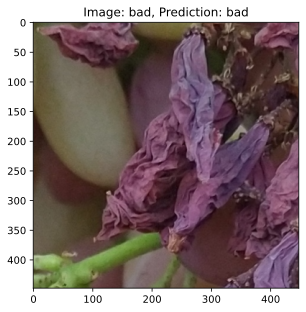

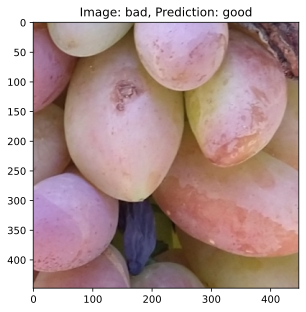

Test Accuracy: 97.3684%
Precision: 98.8506%
Recall: 91.4894%
F1 Score: 0.9503


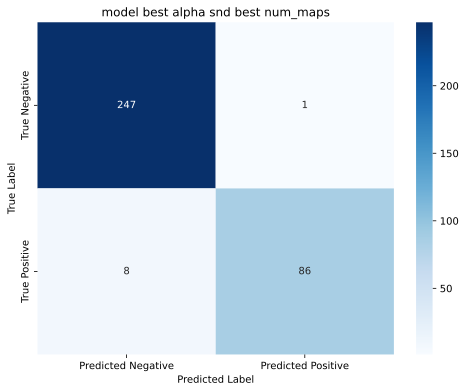

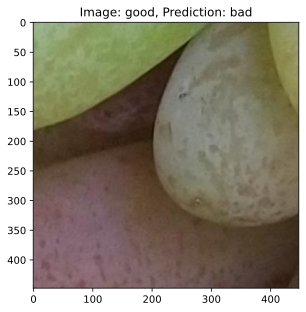

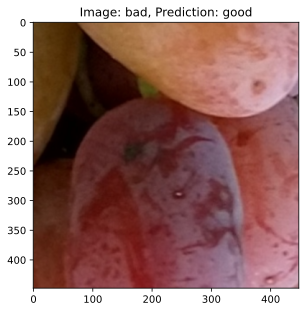

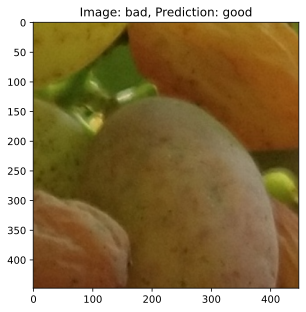

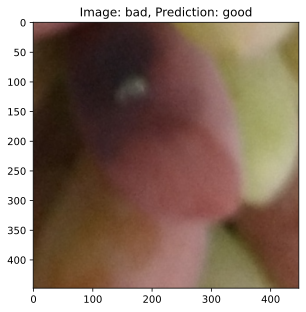

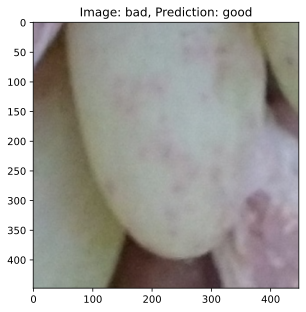

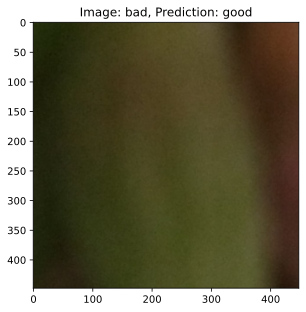

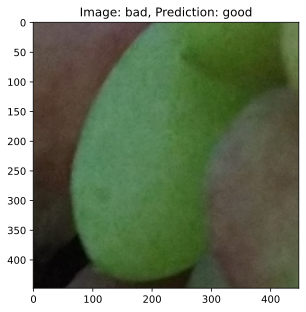

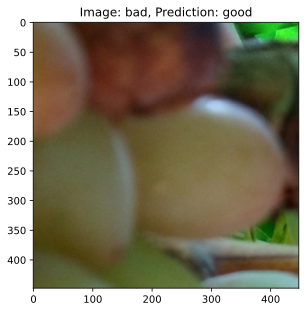

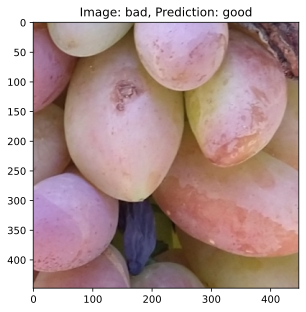

In [22]:
test_loader = data.DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2)

test_binary_classification(best_model, test_loader, device, metrics = True, print_ = False, titolo = "alpha = 1, num_maps = 1")
test_binary_classification(best_model_alpha, test_loader, device, metrics = True, print_ = False, titolo = f"model with best alpha: {best_alpha}")
test_binary_classification(best_model_maps, test_loader, device, metrics = True, print_ = False, titolo = f"model with best num_maps: {best_num_maps}")
test_binary_classification(model_best_alpha_and_maps, test_loader, device, metrics = True, titolo = f"model best alpha snd best num_maps")


test_binary_classification(model_best_alpha_and_maps, test_loader, device, failures = True)
